### py4DSTEM recon of Josephson junctions

Stephanie Ribet

Data from Wendy Wan

20 Aug 2025

In [1]:
import py4DSTEM
import numpy as np

cupyx.jit.rawkernel is experimental. The interface can change in the future.


In [2]:
energy = 300e3
probe_semiangle_mrad = 30

In [3]:
path = 'D:\\Data\\250815\\'

In [4]:
dc = py4DSTEM.read( path + 
    '08152025_Al-Al_91mm_30mrad_15nm_px13p16pm_01_master_masked_masked.h5'
)

In [5]:
dc.data.shape

(512, 512, 192, 192)

In [6]:
dc.calibration.R_pixel_size = 0.1316

In [7]:
dc.get_dp_mean()

VirtualDiffraction( A 2-dimensional array of shape (192, 192) called 'dp_mean',
                    with dimensions:

                        dim0 = [0,1,2,...] pixels
                        dim1 = [0,1,2,...] pixels
)

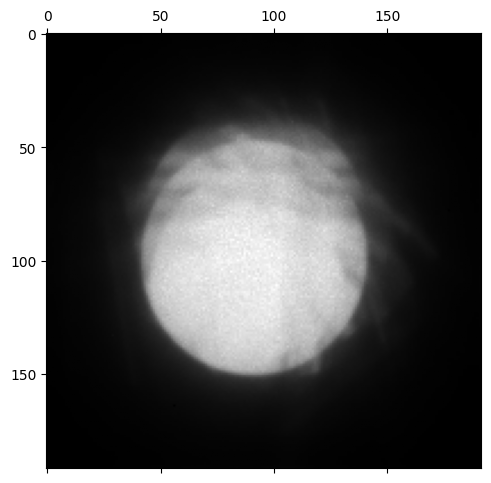

In [8]:
py4DSTEM.show(
    dc.tree('dp_mean').data,
    vmax = 1
)

In [9]:
# median_filter_mask = dc.tree('dp_mean').data > 100

In [10]:
# dc.median_filter_masked_pixels(
#     median_filter_mask
# )

In [11]:
# dc.get_dp_mean()

In [12]:
# py4DSTEM.show(
#     dc.tree('dp_mean'),
#     vmax = 1,
#     cmap = "turbo"
    
# )

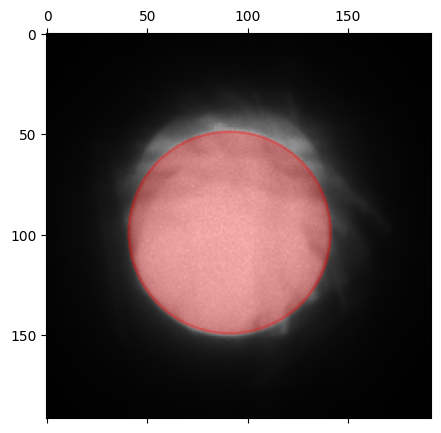

In [14]:
probe_semiangle_px, probe_qx0, probe_qy0 = dc.get_probe_size(
   plot = True 
)

In [15]:
dc.calibration.set_Q_pixel_size(
    probe_semiangle_mrad/probe_semiangle_px
)
dc.calibration.set_Q_pixel_units(
    "mrad"
)

In [16]:
dc.calibration

Calibration( A Metadata instance called 'calibration', containing the following fields:

             Q_pixel_size:      0.595124261363335
             R_pixel_size:      0.1316
             Q_pixel_units:     mrad
             R_pixel_units:     A
             QR_flip:           False
             _root_treepath:    
             probe_semiangle:   50.40964038547979
             qx0_mean:          98.96507318433628
             qy0_mean:          91.07933483957953
)

In [179]:
192/2

96.0

In [194]:
dc.get_virtual_image(
    mode = "circle",
    geometry = ((96,96),8),
    name = "BF1",
    centered = False
    
)

100%|██████████| 262144/262144 [00:17<00:00, 14617.12it/s]


VirtualImage( A 2-dimensional array of shape (512, 512) called 'BF1',
              with dimensions:

                  dim0 = [0,1,2,...] pixels
                  dim1 = [0,1,2,...] pixels
)

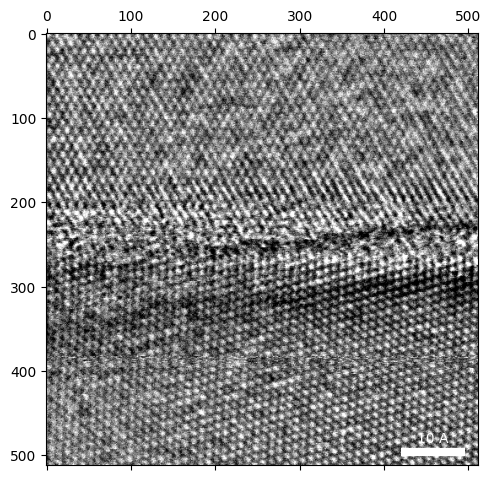

In [195]:
py4DSTEM.show(
    dc.tree('BF1')
)

### DPC

In [19]:
dc_bin_4 = dc.copy().bin_Q(4)

Calculating center of mass: 100%|██████████| 262144/262144 [00:03<00:00, 72160.89probe position/s]
Best fit rotation forced to 0 degrees.
Transpose of intensities forced to False.


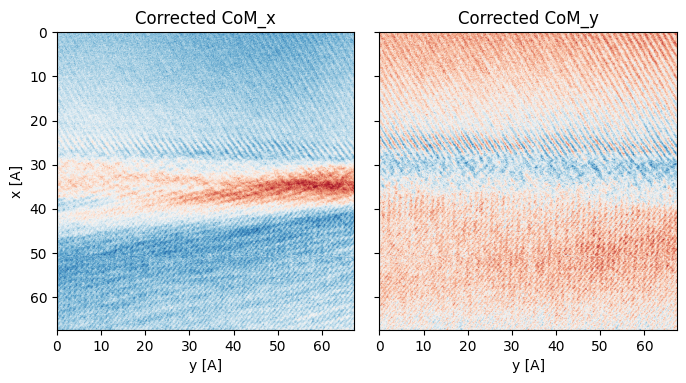

In [20]:
dpc = py4DSTEM.process.phase.DPC(
    energy = energy,
    datacube=dc_bin_4
).preprocess(
    force_com_rotation = 0,
    force_com_transpose = False
)

Reconstructing phase:  41%|████      | 26/64 [00:02<00:02, 12.72 iter/s]
Step-size has decreased below stopping criterion 1e-06.


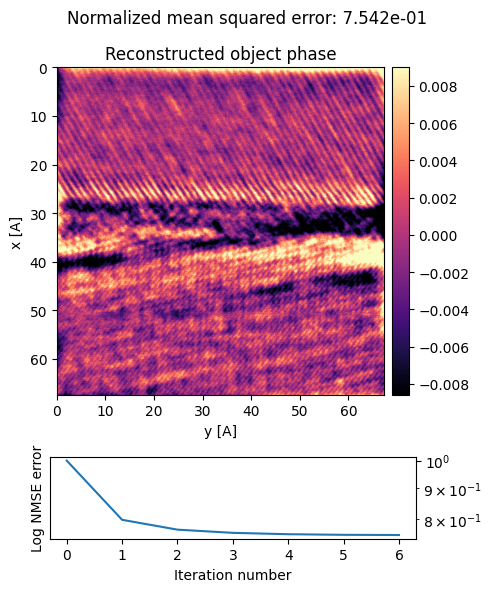

In [21]:
dpc = dpc.reconstruct(
    reset = True,
    q_highpass = 0.1
).visualize()

### parallax

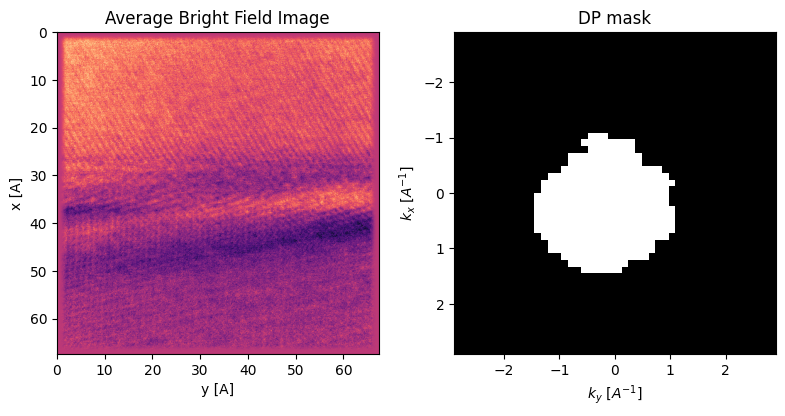

In [22]:
parallax = py4DSTEM.process.phase.Parallax(
    energy = energy,
    datacube = dc_bin_4,
    device = "gpu"
).preprocess(
    threshold_intensity=0.8
)

Alignment at bin 16: 100%|██████████| 4/4 [00:00<00:00, 48.77 image subsets/s]


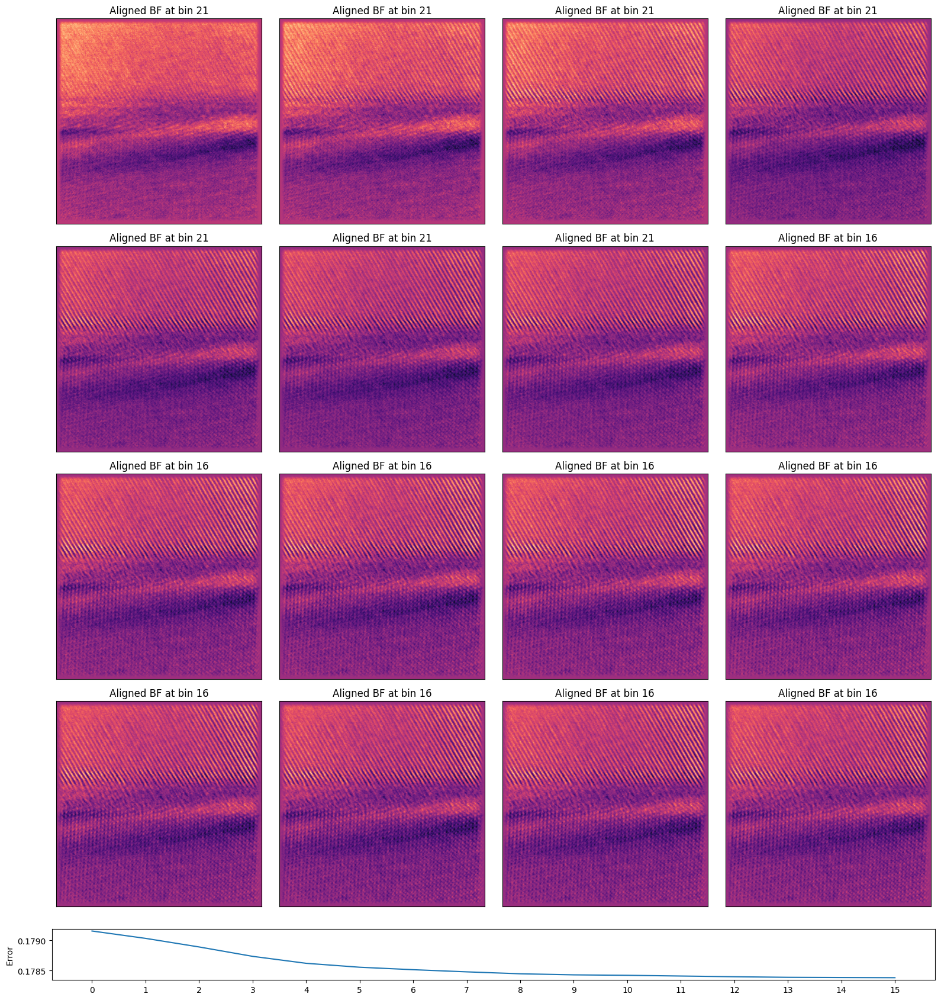

In [23]:
parallax = parallax.reconstruct(
    reset = True,
    alignment_bin_values = [32,32,32,32,32,32,32,16,16,16,16,16,16,16,16,16],
    running_average=False
)

In [24]:
parallax.aberration_fit(
    force_rotation_angle_deg=0,
    max_radial_order=2,
    max_angular_order=2,

)

         Initial aberration coefficients          
--------------------------------------------------
  rotation   transpose    C1      stig  stig angle
   [deg]       ---       [Ang]   [Ang]     [deg]  
----------   -------   -------   -----   ---------
   0.0        False      -22      23       11.5   

         Refined aberration coefficients          
--------------------------------------------------
aberration    radial   angular   angle   magnitude
   name       order     order    [deg]     [Ang]  
----------   -------   -------   -----   ---------
    C1          2         0       ---       -18   
   stig         2         2       8.9       20    


Parallax( A Node called 'parallax_reconstruction', containing the following top-level objects in its tree:

)

Parallax( A Node called 'parallax_reconstruction', containing the following top-level objects in its tree:

)

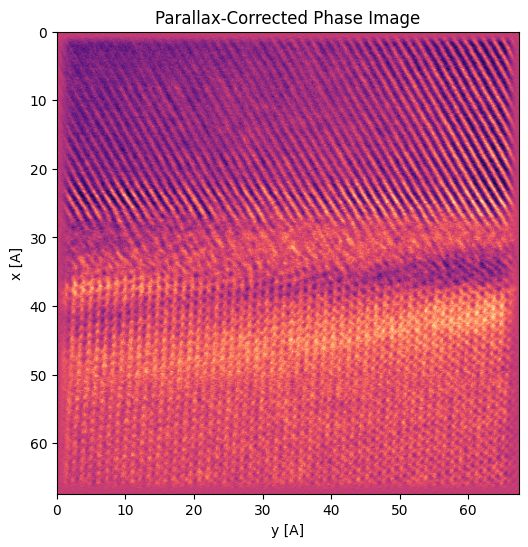

In [25]:
parallax.aberration_correct()

In [26]:
py4DSTEM.show?

Signature:
py4DSTEM.show(
    ar,
    figsize=(5, 5),
    cmap='gray',
    scaling='none',
    intensity_range='ordered',
    clipvals=None,
    vmin=None,
    vmax=None,
    min=None,
    max=None,
    power=None,
    power_offset=True,
    combine_images=False,
    ticks=True,
    bordercolor=None,
    borderwidth=5,
    show_image=True,
    return_ar_scaled=False,
    return_intensity_range=False,
    returncax=False,
    returnfig=False,
    figax=None,
    hist=False,
    n_bins=256,
    mask=None,
    mask_color='k',
    mask_alpha=0.0,
    masked_intensity_range=False,
    rectangle=None,
    circle=None,
    annulus=None,
    ellipse=None,
    points=None,
    grid_overlay=None,
    cartesian_grid=None,
    polarelliptical_grid=None,
    rtheta_grid=None,
    scalebar=None,
    calibration=None,
    rx=None,
    ry=None,
    space='Q',
    pixelsize=None,
    pixelunits=None,
    x0=None,
    y0=None,
    a=None,
    e=None,
    theta=None,
    title=None,
    show_fft=False,
 

In [28]:
calibration = {
             'pixelsize':      0.1316,
             'pixelunits':     'A'
}

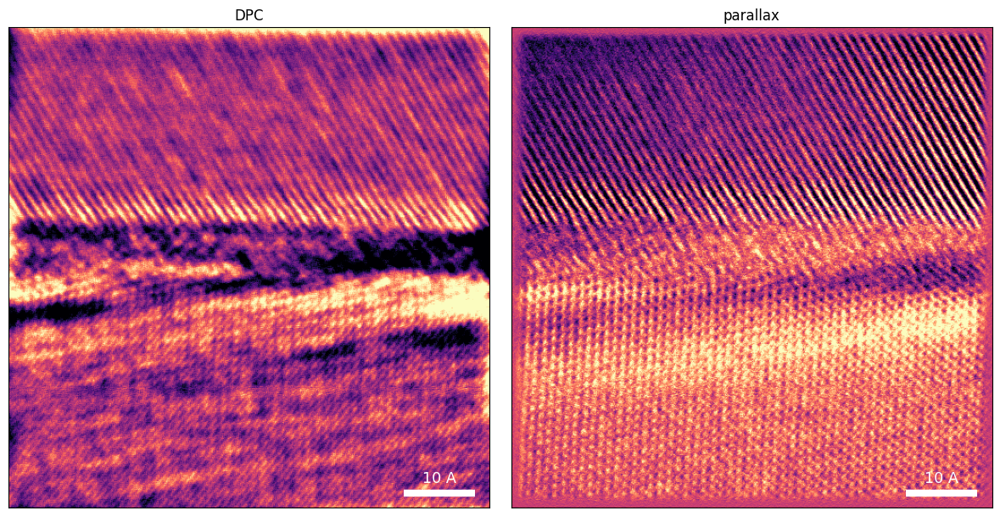

In [29]:
py4DSTEM.show(
    [
        dpc.object_phase,
        parallax.object_cropped   
    ],
    cmap = "magma",
    title = ['DPC', 'parallax'],
    ticks = False,
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    
)

### ptycho

In [30]:
dc_vacuum = py4DSTEM.read(
    path + 'processed_probe_master.h5'
    
)

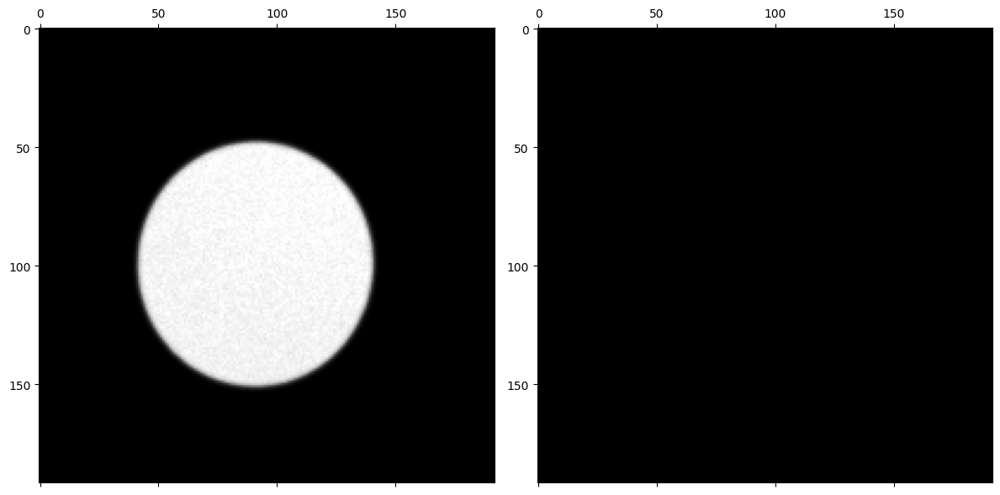

In [31]:
py4DSTEM.show(
    [
        dc_vacuum[0],
        dc_vacuum[1]
    ]
)

In [32]:
vacuum_probe = dc_vacuum[0]

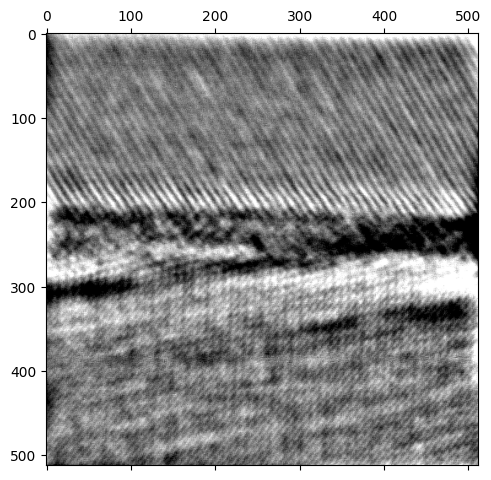

In [33]:
py4DSTEM.show(
    dpc.object_phase
)

In [ ]:
dc_crop = dc.copy()
dc_crop.data = dc_crop.data[384:512,0:256]

In [ ]:
dc_crop_bin_2 = dc_crop.copy().bin_Q(2)


In [ ]:
dc_crop_bin_4 = dc_crop.copy().bin_Q(4)

Transpose of intensities forced to False.
Best fit rotation = 7 degrees.
Normalizing amplitudes: 100%|██████████| 32768/32768 [00:02<00:00, 12608.25probe position/s]


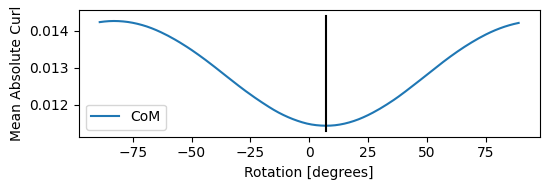

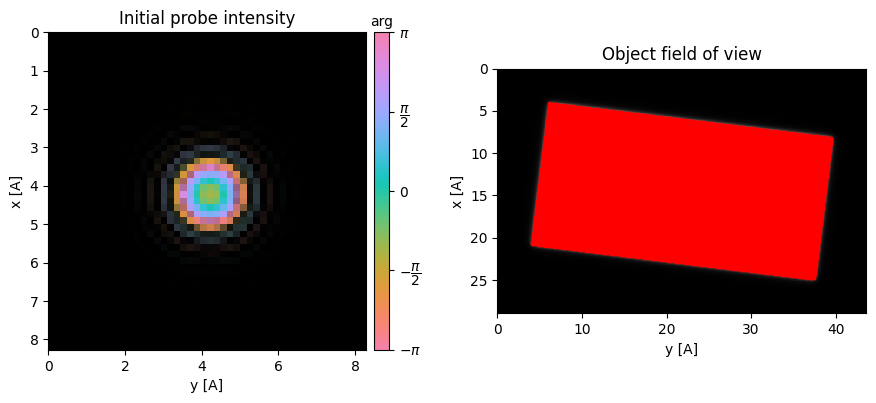

In [ ]:
ptycho = py4DSTEM.process.phase.SingleslicePtychography(
    energy = energy, 
    datacube = dc_crop_bin_4,
    vacuum_probe_intensity=vacuum_probe,
    device = "gpu",
    defocus = -15,
).preprocess(
    # force_com_rotation = 0,
    force_com_transpose = False,
    plot_center_of_mass=False,
    shifting_interpolation_order = 1
)

Performing 5 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 1024 measurements.
Reconstructing object and probe: 100%|██████████| 5/5 [00:01<00:00,  3.78 iter/s]


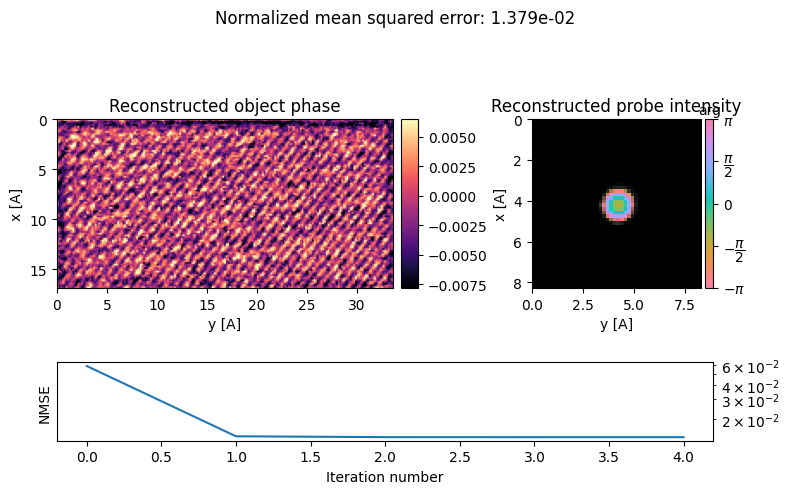

In [ ]:
ptycho = ptycho.reconstruct(
    num_iter = 5,
    step_size = 0.1,
    max_batch_size=1024
).visualize()


In [ ]:
from py4DSTEM.process.phase.parameter_optimize import OptimizationParameter, PtychographyOptimizer
init_args = {
    'datacube':dc_crop_bin_4,
    'energy':energy,
    'vacuum_probe_intensity':vacuum_probe,
    'device':'gpu',
    'defocus':OptimizationParameter(-35,-75,45), 
}

    
affine_args = {
    # 'scale0':OptimizationParameter(1.0,0.7,1.2),
    # 'scale1':OptimizationParameter(1.0,0.7,1.2),
    # 'dilation':OptimizationParameter(1.0,0.9,1.1),
}
preprocess_args = {
    'force_com_rotation':0,
    'force_com_transpose':True,
    'shifting_interpolation_order':1
    # 'force_angular_sampling':OptimizationParameter(2.586560348928303,2,3)
}
recon_args = {
    'num_iter':3,
    'step_size':0.1,
    'max_batch_size':512,
}

optimizer = PtychographyOptimizer(
    py4DSTEM.process.phase.SingleslicePtychography,
    init_args = init_args,
    affine_args = affine_args,
    preprocess_args = preprocess_args,
    reconstruction_args = recon_args,
)


Searching parameters: 100%|██████████| 6/6 [00:25<00:00,  4.29s/it]


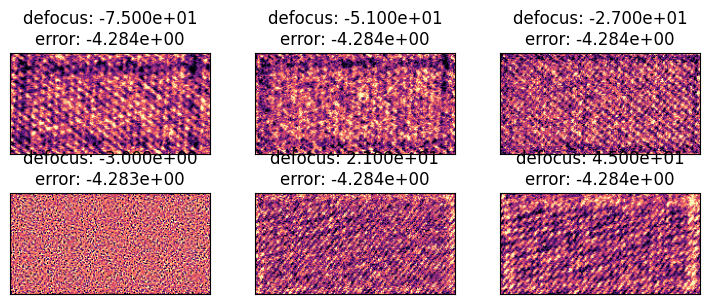

In [ ]:
optimizer.grid_search(
    n_points = 6
)

Optimizing parameters: 100%|██████████| 30/30 [02:08<00:00,  4.30s/it]


Optimized parameters:
defocus: 32.991513321592564


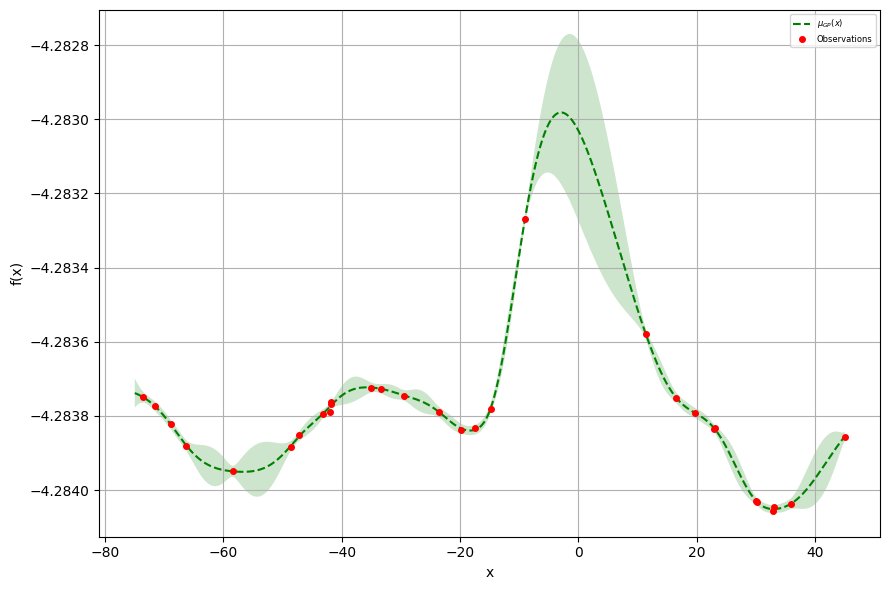

In [ ]:
optimizer.optimize(
    n_calls=30,
    n_initial_points=10,
)

optimizer.visualize()

Best fit rotation forced to 0 degrees.
Transpose of intensities forced to False.
Normalizing amplitudes: 100%|██████████| 32768/32768 [00:02<00:00, 13431.22probe position/s]


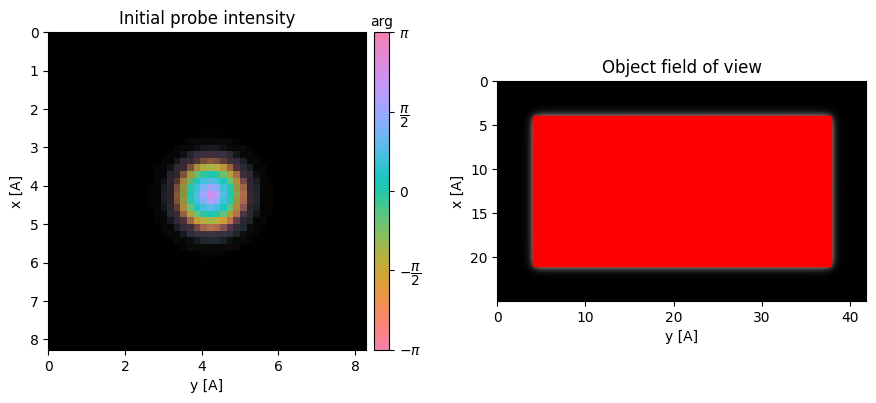

In [ ]:
ptycho = py4DSTEM.process.phase.SingleslicePtychography(
    energy = energy, 
    datacube = dc_crop_bin_4,
    vacuum_probe_intensity=vacuum_probe,
    device = "gpu",
    defocus = 33,
    object_type="potential"
).preprocess(
    force_com_rotation = 0,
    force_com_transpose = False,
    plot_center_of_mass=False,
    shifting_interpolation_order = 1
)

Performing 5 iterations using a potential object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 1024 measurements.
Reconstructing object and probe: 100%|██████████| 5/5 [00:01<00:00,  2.95 iter/s]


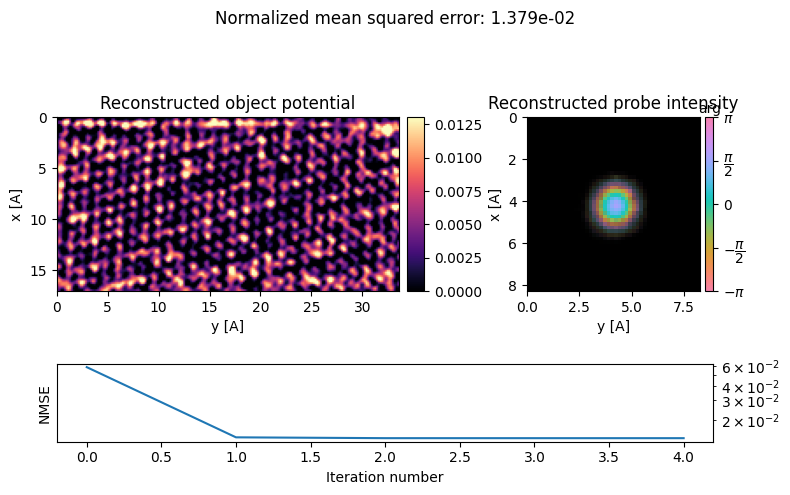

In [ ]:
ptycho = ptycho.reconstruct(
    num_iter = 5,
    step_size = 0.1,
    max_batch_size=1024,
    q_lowpass=1.5
).visualize()


Optimizing parameters: 100%|████████████████████| 30/30 [01:50<00:00,  3.69s/it]

Optimized parameters:
defocus: 35.819224623354735


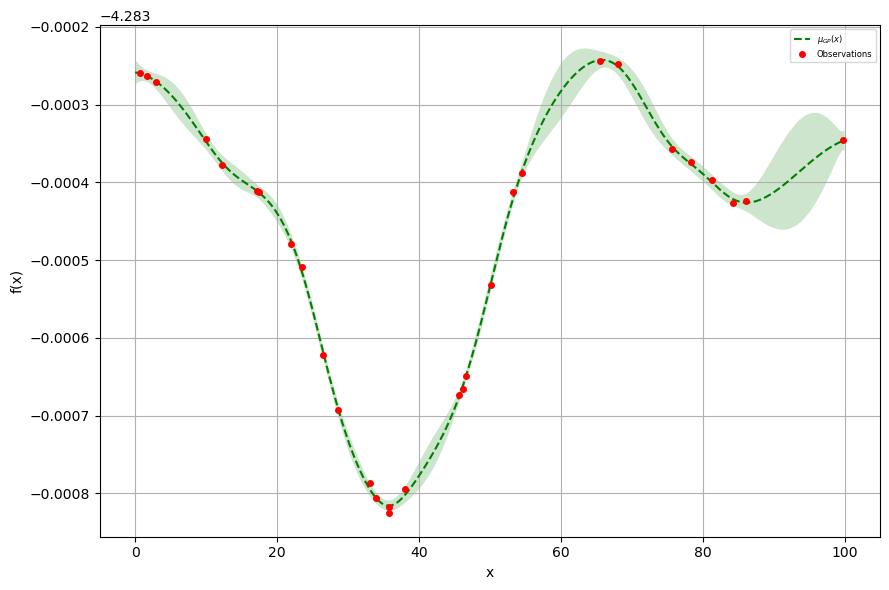

In [ ]:
from py4DSTEM.process.phase.parameter_optimize import OptimizationParameter, PtychographyOptimizer
init_args = {
    'datacube':dc_crop_bin_4,
    'energy':energy,
    'vacuum_probe_intensity':vacuum_probe,
    'device':'gpu',
    'defocus':OptimizationParameter(22,0,100), 
}

    
affine_args = {
    # 'scale0':OptimizationParameter(1.0,0.7,1.2),
    # 'scale1':OptimizationParameter(1.0,0.7,1.2),
    # 'dilation':OptimizationParameter(1.0,0.9,1.1),
}
preprocess_args = {
    'force_com_rotation':0,
    'force_com_transpose':True,
    'shifting_interpolation_order':1
    # 'force_angular_sampling':OptimizationParameter(2.586560348928303,2,3)
}
recon_args = {
    'num_iter':3,
    'step_size':0.1,
    'max_batch_size':512,
    'q_lowpass':1.5,
}

optimizer = PtychographyOptimizer(
    py4DSTEM.process.phase.SingleslicePtychography,
    init_args = init_args,
    affine_args = affine_args,
    preprocess_args = preprocess_args,
    reconstruction_args = recon_args,
)


optimizer.optimize(
    n_calls=30,
    n_initial_points=10,
)

optimizer.visualize()

Optimizing parameters: 100%|██████████| 30/30 [02:08<00:00,  4.29s/it]

Optimized parameters:
C12: 35.18259433667944
phi12: -0.7956521736259913


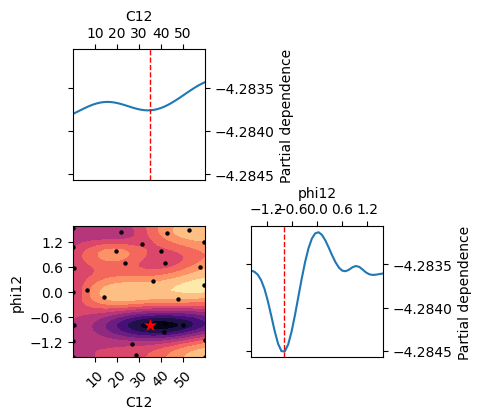

In [ ]:
from py4DSTEM.process.phase.parameter_optimize import OptimizationParameter, PtychographyOptimizer
init_args = {
    'datacube':dc_crop_bin_4,
    'energy':energy,
    'vacuum_probe_intensity':vacuum_probe,
    'device':'gpu',
    'defocus':35, 
    'C12':OptimizationParameter(0,0,60),
    'phi12':OptimizationParameter(0, -np.pi/2, np.pi/2)
}

    
affine_args = {
    # 'scale0':OptimizationParameter(1.0,0.7,1.2),
    # 'scale1':OptimizationParameter(1.0,0.7,1.2),
    # 'dilation':OptimizationParameter(1.0,0.9,1.1),
}
preprocess_args = {
    'force_com_rotation':0,
    'force_com_transpose':True,
    'shifting_interpolation_order':1
    # 'force_angular_sampling':OptimizationParameter(2.586560348928303,2,3)
}
recon_args = {
    'num_iter':3,
    'step_size':0.1,
    'max_batch_size':512,
    'q_lowpass':1.5,
}

optimizer = PtychographyOptimizer(
    py4DSTEM.process.phase.SingleslicePtychography,
    init_args = init_args,
    affine_args = affine_args,
    preprocess_args = preprocess_args,
    reconstruction_args = recon_args,
)


optimizer.optimize(
    n_calls=30,
    n_initial_points=10,
)

optimizer.visualize()

Best fit rotation forced to 0 degrees.
Transpose of intensities forced to False.
Normalizing amplitudes: 100%|██████████| 32768/32768 [00:02<00:00, 13021.83probe position/s]


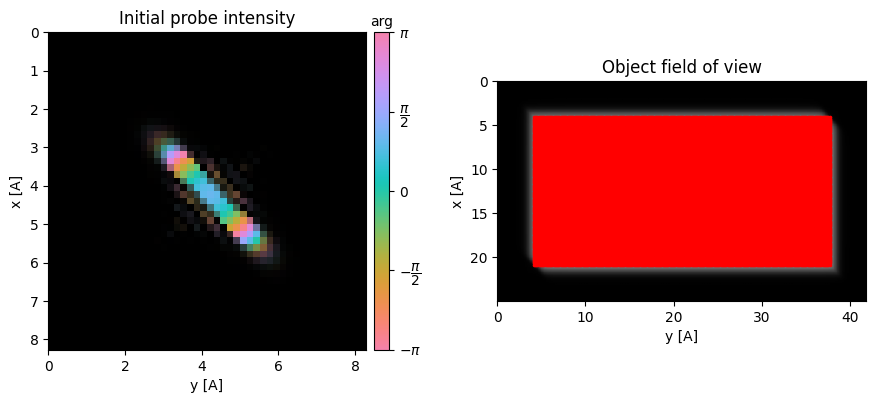

In [ ]:
ptycho = py4DSTEM.process.phase.SingleslicePtychography(
    energy = energy, 
    datacube = dc_crop_bin_4,
    vacuum_probe_intensity=vacuum_probe,
    device = "gpu",
    defocus = 35,
    object_type="potential",
    C12 = 30,
    phi12 = -0.806 
).preprocess(
    force_com_rotation = 0,
    force_com_transpose = False,
    plot_center_of_mass=False,
    shifting_interpolation_order = 1
)

Performing 5 iterations using a potential object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 1024 measurements.
Reconstructing object and probe: 100%|██████████| 5/5 [00:01<00:00,  4.21 iter/s]


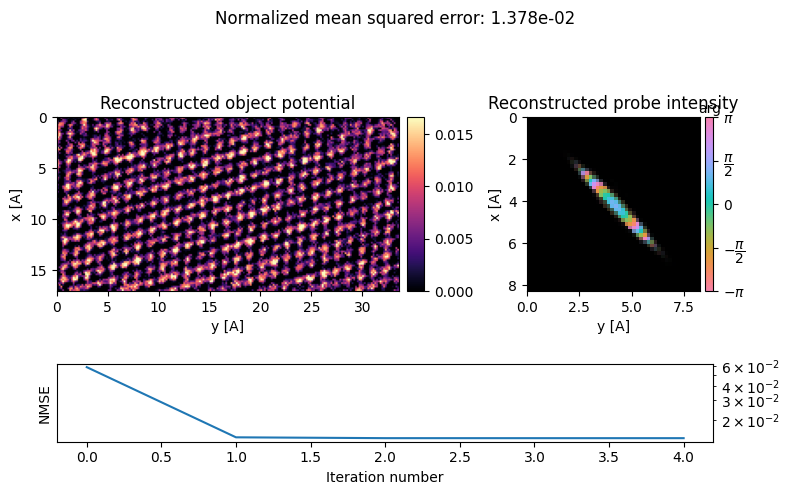

In [ ]:
ptycho = ptycho.reconstruct(
    num_iter = 5,
    step_size = 0.1,
    max_batch_size=1024,
    # q_lowpass=2.5
).visualize()


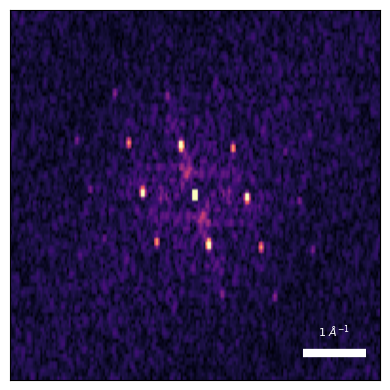

In [ ]:
ptycho.show_object_fft(
    power = 0.5
)

Best fit rotation forced to 0 degrees.
Transpose of intensities forced to False.
Normalizing amplitudes: 100%|██████████| 32768/32768 [00:02<00:00, 13174.79probe position/s]


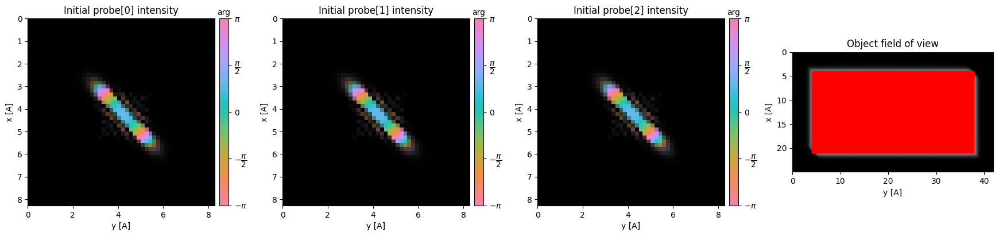

In [ ]:
ptycho = py4DSTEM.process.phase.MixedstatePtychography(
    energy = energy, 
    datacube = dc_crop_bin_4,
    vacuum_probe_intensity=vacuum_probe,
    device = "gpu",
    defocus = 35,
    object_type="potential",
    C12 = 30,
    phi12 = -0.806,
    num_probes=3,
).preprocess(
    force_com_rotation = 0,
    force_com_transpose = False,
    plot_center_of_mass=False,
    shifting_interpolation_order = 1
)

Performing 5 iterations using a potential object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 1024 measurements.
Reconstructing object and probe: 100%|██████████| 5/5 [00:03<00:00,  1.32 iter/s]


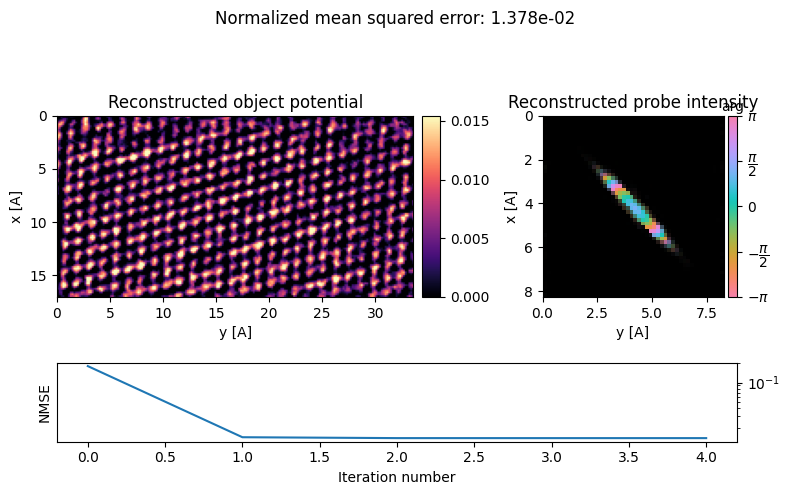

In [ ]:
ptycho = ptycho.reconstruct(
    num_iter = 5,
    step_size = 0.1,
    max_batch_size=1024,
    q_lowpass=2.7
).visualize()


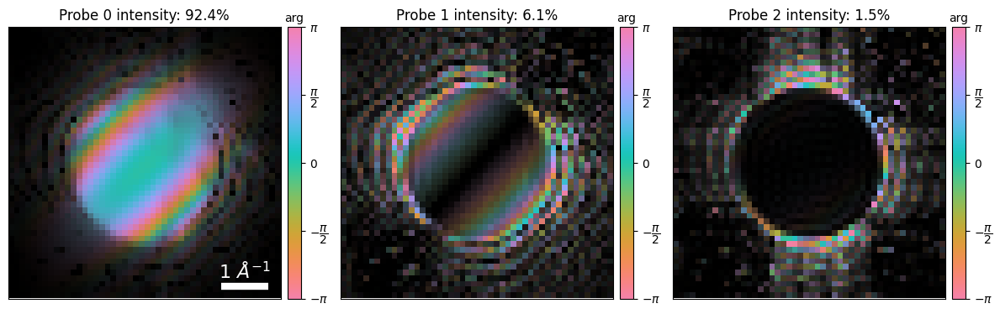

In [ ]:
ptycho.show_fourier_probe()

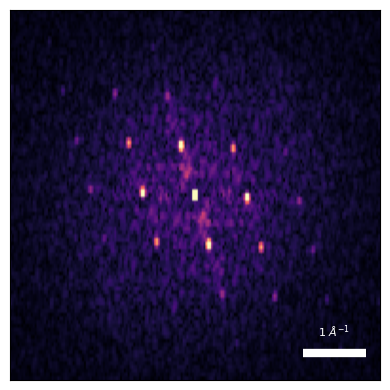

In [ ]:
ptycho.show_object_fft(
    power = 0.5
)

Best fit rotation forced to 0 degrees.
Transpose of intensities forced to False.
Normalizing amplitudes: 100%|██████████| 262144/262144 [00:43<00:00, 6033.37probe position/s]


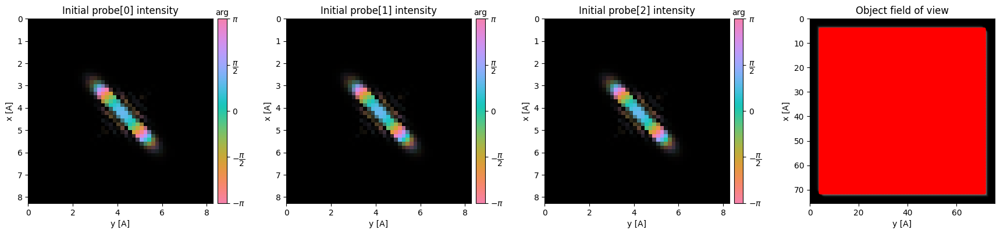

In [34]:
ptycho = py4DSTEM.process.phase.MixedstatePtychography(
    energy = energy, 
    datacube = dc_bin_4,
    vacuum_probe_intensity=vacuum_probe,
    device = "gpu",
    defocus = 35,
    object_type="potential",
    C12 = 30,
    phi12 = -0.806,
    num_probes=3,
).preprocess(
    force_com_rotation = 0,
    force_com_transpose = False,
    plot_center_of_mass=False,
    # shifting_interpolation_order = 1
)

Performing 5 iterations using a potential object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 8192 measurements.
Reconstructing object and probe: 100%|██████████| 5/5 [00:20<00:00,  4.16s/ iter]


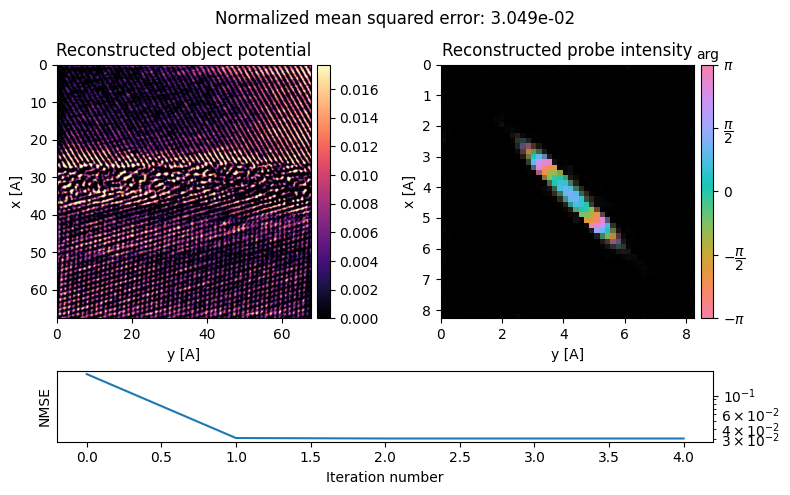

In [ ]:
ptycho = ptycho.reconstruct(
    num_iter = 5,
    step_size = 0.1,
    max_batch_size=1024*8,
    q_lowpass=2.7
).visualize()


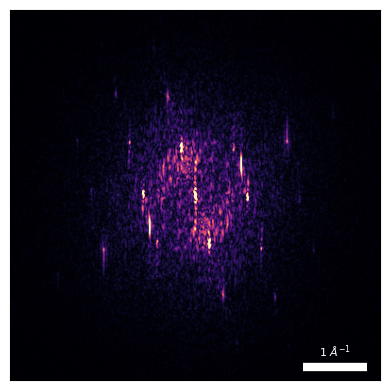

In [ ]:
ptycho.show_object_fft()

Performing 50 iterations using a potential object type, with the gradient-descent algorithm, with normalization_min: 1 and step_size: 0.1, in batches of max 8192 measurements.
Reconstructing object and probe: 100%|██████████| 50/50 [03:11<00:00,  3.83s/ iter]


MixedstatePtychography( A Node called 'mixed-state_ptychographic_reconstruction', containing the following top-level objects in its tree:

)

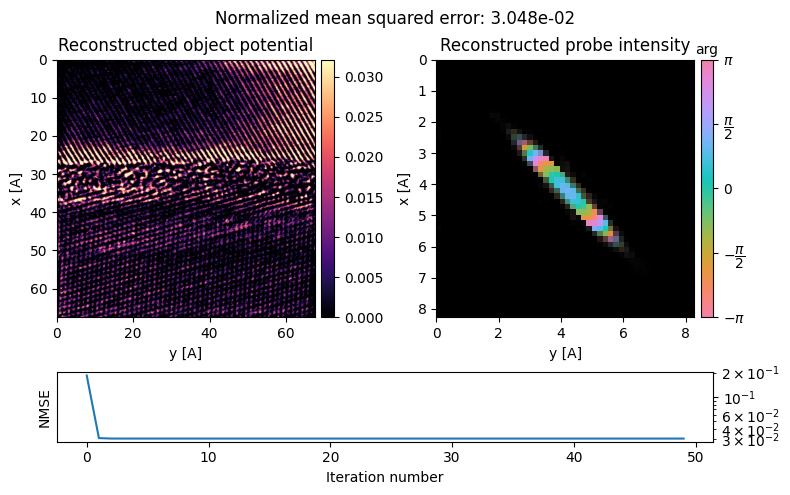

In [35]:
ptycho = ptycho.reconstruct(
    num_iter = 50,
    step_size = 0.1,
    max_batch_size=1024*8,
    q_lowpass=5,
)

ptycho.visualize()


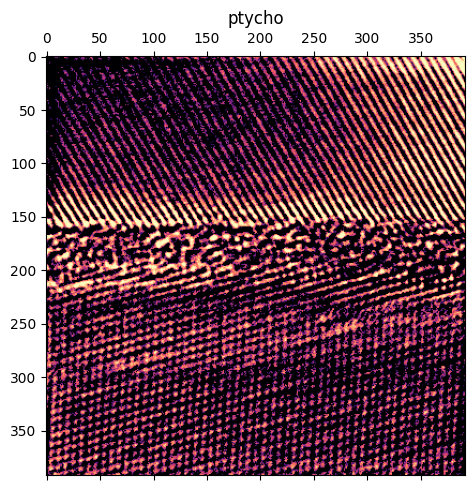

In [36]:
py4DSTEM.show(
    ptycho.object_cropped,
    cmap = "magma",
    title = 'ptycho',
    power = 0.4,
    
)

In [62]:
py4DSTEM.show?

Signature:
py4DSTEM.show(
    ar,
    figsize=(5, 5),
    cmap='gray',
    scaling='none',
    intensity_range='ordered',
    clipvals=None,
    vmin=None,
    vmax=None,
    min=None,
    max=None,
    power=None,
    power_offset=True,
    combine_images=False,
    ticks=True,
    bordercolor=None,
    borderwidth=5,
    show_image=True,
    return_ar_scaled=False,
    return_intensity_range=False,
    returncax=False,
    returnfig=False,
    figax=None,
    hist=False,
    n_bins=256,
    mask=None,
    mask_color='k',
    mask_alpha=0.0,
    masked_intensity_range=False,
    rectangle=None,
    circle=None,
    annulus=None,
    ellipse=None,
    points=None,
    grid_overlay=None,
    cartesian_grid=None,
    polarelliptical_grid=None,
    rtheta_grid=None,
    scalebar=None,
    calibration=None,
    rx=None,
    ry=None,
    space='Q',
    pixelsize=None,
    pixelunits=None,
    x0=None,
    y0=None,
    a=None,
    e=None,
    theta=None,
    title=None,
    show_fft=False,
 

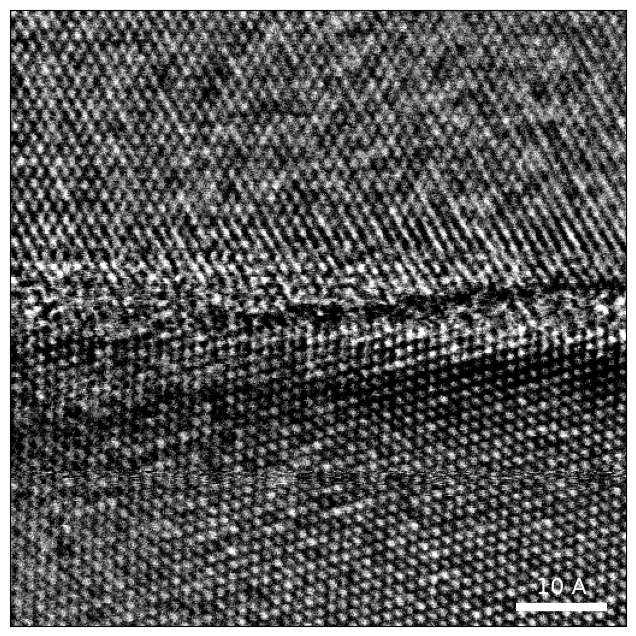

In [197]:
fig, axes = py4DSTEM.show(
    dc.tree('BF1'),
    # cmap = "grey",
    # title = ['BF','DPC', 'parallax', 'ptycho'],
    figsize = (8,8),
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    returnfig = True,
    ticks = False,
    power = 0.6,
    scaling = 'log',
    vmin = 0.15,
    vmax = 0.99
    
    
)
fig.savefig('BF.png', dpi=300)

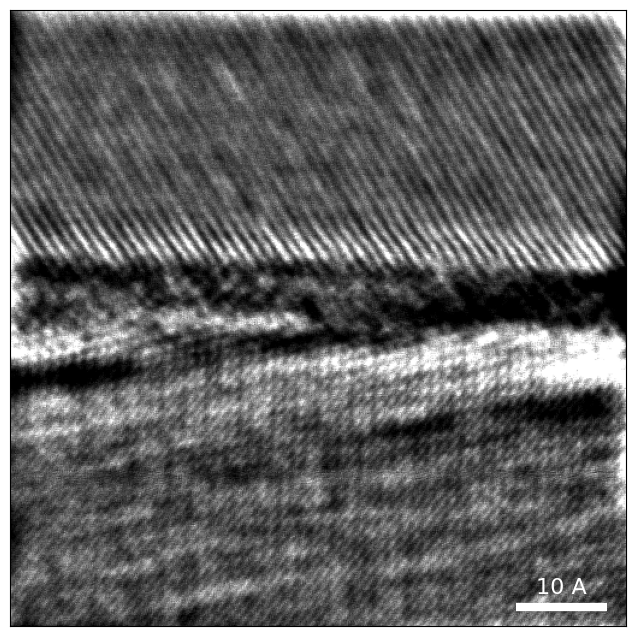

In [76]:
fig, axes = py4DSTEM.show(
    dpc.object_phase,
    # cmap = "grey",
    # title = ['BF','DPC', 'parallax', 'ptycho'],
    figsize = (8,8),
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    returnfig = True,
    ticks = False,
    power = 4,
    scaling = 'log'
    
    
)
fig.savefig('dpc_phase.png', dpi=300)

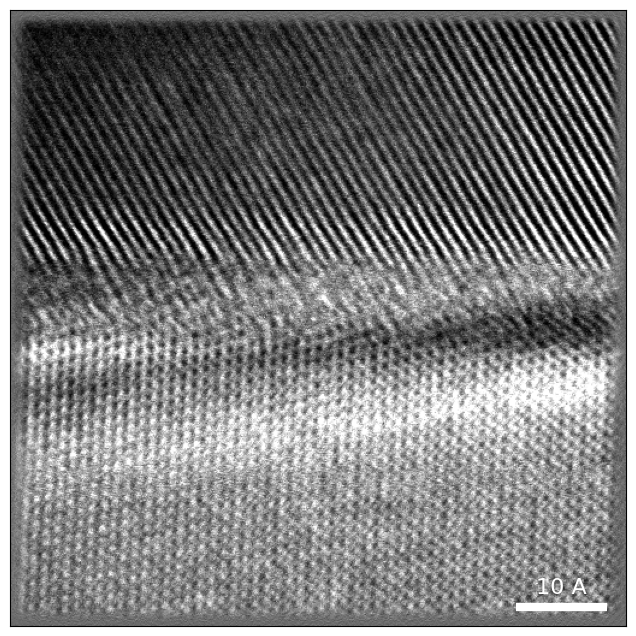

In [81]:
fig, axes = py4DSTEM.show(
    parallax.object_cropped,
    # cmap = "grey",
    # title = ['BF','DPC', 'parallax', 'ptycho'],
    figsize = (8,8),
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    returnfig = True,
    ticks = False,
    power = 2,
    scaling = 'log'
    
    
)
fig.savefig('parallax.png', dpi=300)

In [94]:
normalized = ptycho.object_cropped/ptycho.object_cropped.max()

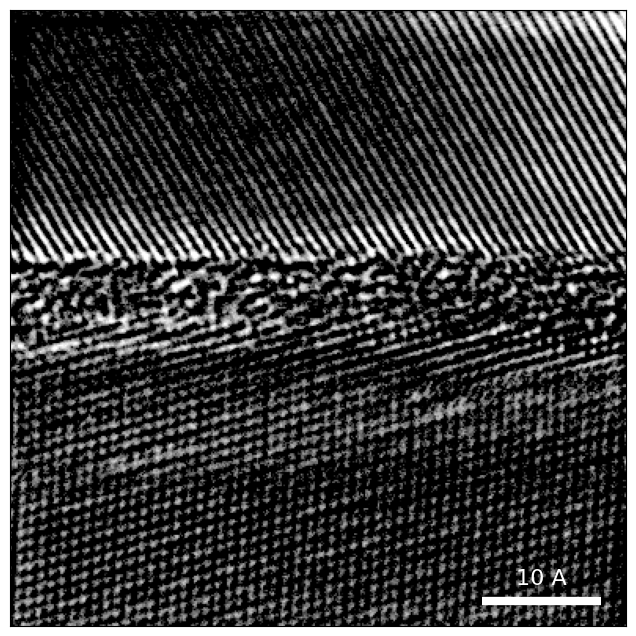

In [140]:
fig, axes = py4DSTEM.show(
    normalized,
    # cmap = "grey",
    # title = ['BF','DPC', 'parallax', 'ptycho'],
    figsize = (8,8),
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    returnfig = True,
    ticks = False,
    power = 0.5,
    # power = .5,
    # scaling = 'log'
    vmax = 1-5e-3,
    vmin = -20
    
    
)
fig.savefig('ptycho.png', dpi=300)

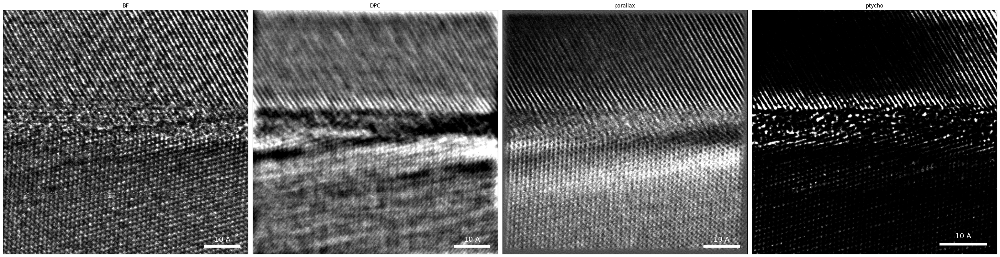

In [44]:
fig, axes = py4DSTEM.show(
    [
        dc.tree('BF'),
        dpc.object_phase,
        parallax.object_cropped,
        ptycho.object_cropped
    ],
    cmap = "grey",
    title = ['BF','DPC', 'parallax', 'ptycho'],
    axsize = (8,10),
    scalebar = {},
    space = 'R',
    calibration = dc_bin_4.calibration,
    returnfig = True,
    ticks = False,
    power = 3
    
    
)

In [ ]:
axes

array([[<Axes: title={'center': 'BF'}>, <Axes: title={'center': 'DPC'}>,
        <Axes: title={'center': 'parallax'}>,
        <Axes: title={'center': 'ptycho'}>]], dtype=object)

In [ ]:
title = ['BF','DPC', 'parallax', 'ptycho']
for i, ax in enumerate(axes[0]):
    ax.set_title(title[i], fontsize = 50)
fig.savefig('ptycho_v2.png',dpi=300)

In [ ]:
i

1